In [21]:
import pandas as pd
import numpy as np 
import geopandas as gpd 
import contextily as ctx 
import matplotlib.pyplot as plt


In [9]:
# url = 'https://proxy.hxlstandard.org/data/e2bb4b/download/jrc-covid-19-regions-hxl.csv'
path = 'data/jrc-covid-19-regions-hxl.csv'
df = pd.read_csv(path)
df.head()


/home/alexsnow/.conda/envs/gis/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (4,5,6,7,8,9,10,11,12,13) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Date,iso3,CountryName,Region,lat,lon,CumulativePositive,CumulativeDeceased,CumulativeRecovered,CurrentlyPositive,Hospitalized,IntensiveCare,EUcountry,EUCPMcountry,NUTS
0,#date,#country+code+iso3,#country+name,#adm1+name,#geo+lat,#geo+lon,#affected+positive+total,#affected+dead+total,#affected+recovered+total,#affected+positive,#affected+hospitalized,#affected+intensive_care,#indicator+eu,#indicator+eucpm,NaN
1,2020-01-22,GRC,Greece,NOT SPECIFIED,NaN,NaN,0,0,0,0,NaN,NaN,TRUE,TRUE,NaN
2,2020-01-22,ISL,Iceland,NOT SPECIFIED,NaN,NaN,0,0,0,0,NaN,NaN,FALSE,TRUE,NaN
3,2020-01-22,LIE,Liechtenstein,Liechtenstein,47.164696,9.555,0,0,0,0,NaN,NaN,FALSE,FALSE,LI
4,2020-01-22,MCO,Monaco,Monaco,43.738348,7.424451,0,0,0,0,NaN,NaN,FALSE,FALSE,MC


In [10]:
df.dtypes

Date                   object
iso3                   object
CountryName            object
Region                 object
lat                    object
lon                    object
CumulativePositive     object
CumulativeDeceased     object
CumulativeRecovered    object
CurrentlyPositive      object
Hospitalized           object
IntensiveCare          object
EUcountry              object
EUCPMcountry           object
NUTS                   object
dtype: object

In [22]:
dtype = {
'Date'    :               object,
'iso3'     :              object,
'CountryName' :            object,
'Region'      :           object,
'lat'        :            float,
'lon'       :             float,
'CumulativePositive'  :   float,
'CumulativeDeceased'   :  float,
'CumulativeRecovered'  :  float,
'CurrentlyPositive'    :  float,
'Hospitalized'         :  float,
'IntensiveCare'        :  float,
'EUcountry'            :  np.bool,
'EUCPMcountry'         :  np.bool,
'NUTS'                 :  object
}
df = pd.read_csv(path,dtype=dtype,skiprows=range(1,2))
df.head()

,Date,iso3,CountryName,Region,lat,lon,CumulativePositive,CumulativeDeceased,CumulativeRecovered,CurrentlyPositive,Hospitalized,IntensiveCare,EUcountry,EUCPMcountry,NUTS
0,2020-01-22,GRC,Greece,NOT SPECIFIED,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,True,True,NaN
1,2020-01-22,ISL,Iceland,NOT SPECIFIED,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,False,True,NaN
2,2020-01-22,LIE,Liechtenstein,Liechtenstein,47.164696,9.555000,0.0,0.0,0.0,0.0,NaN,NaN,False,False,LI
3,2020-01-22,MCO,Monaco,Monaco,43.738348,7.424451,0.0,0.0,0.0,0.0,NaN,NaN,False,False,MC
4,2020-01-22,MKD,North Macedonia,North Macedonia,41.611000,21.751417,0.0,0.0,0.0,0.0,NaN,NaN,False,True,MK


In [24]:
df.shape

(173019, 15)

In [25]:
df.Date.max(), df.Date.min()

('2021-05-07', '2020-01-22')

In [28]:
df.dropna(axis=0, subset=['lat','lon'], inplace=True)
df.head()

,Date,iso3,CountryName,Region,lat,lon,CumulativePositive,CumulativeDeceased,CumulativeRecovered,CurrentlyPositive,Hospitalized,IntensiveCare,EUcountry,EUCPMcountry,NUTS
2,2020-01-22,LIE,Liechtenstein,Liechtenstein,47.164696,9.555000,0.0,0.0,0.0,0.0,NaN,NaN,False,False,LI
3,2020-01-22,MCO,Monaco,Monaco,43.738348,7.424451,0.0,0.0,0.0,0.0,NaN,NaN,False,False,MC
4,2020-01-22,MKD,North Macedonia,North Macedonia,41.611000,21.751417,0.0,0.0,0.0,0.0,NaN,NaN,False,True,MK
5,2020-01-22,SMR,San Marino,San Marino,43.942973,12.460035,0.0,0.0,0.0,0.0,NaN,NaN,False,False,SM
6,2020-01-22,SRB,Serbia,Serbia,44.206802,20.911009,0.0,0.0,0.0,0.0,NaN,NaN,False,True,NaN


In [29]:
CRS = 'EPSG:4326' # Ref - http://epsg.io/4326
gdf = gpd.GeoDataFrame(df, crs=CRS, geometry=gpd.points_from_xy(df.lat,df.lon))
gdf.head()

,Date,iso3,CountryName,Region,lat,lon,CumulativePositive,CumulativeDeceased,CumulativeRecovered,CurrentlyPositive,Hospitalized,IntensiveCare,EUcountry,EUCPMcountry,NUTS,geometry
2,2020-01-22,LIE,Liechtenstein,Liechtenstein,47.164696,9.555000,0.0,0.0,0.0,0.0,NaN,NaN,False,False,LI,POINT (47.16470 9.55500)
3,2020-01-22,MCO,Monaco,Monaco,43.738348,7.424451,0.0,0.0,0.0,0.0,NaN,NaN,False,False,MC,POINT (43.73835 7.42445)
4,2020-01-22,MKD,North Macedonia,North Macedonia,41.611000,21.751417,0.0,0.0,0.0,0.0,NaN,NaN,False,True,MK,POINT (41.61100 21.75142)
5,2020-01-22,SMR,San Marino,San Marino,43.942973,12.460035,0.0,0.0,0.0,0.0,NaN,NaN,False,False,SM,POINT (43.94297 12.46004)
6,2020-01-22,SRB,Serbia,Serbia,44.206802,20.911009,0.0,0.0,0.0,0.0,NaN,NaN,False,True,NaN,POINT (44.20680 20.91101)


<AxesSubplot:>

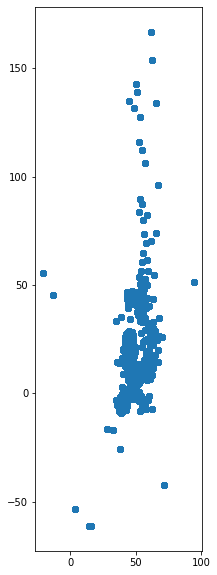

In [34]:
gdf.plot(figsize=(12,10))